In [2]:
import pandas as pd
import matplotlib.pyplot as plt


In [3]:
fn = "https://raw.githubusercontent.com/PyPSA/powerplantmatching/master/powerplants.csv"
ppl = pd.read_csv(fn, index_col = 0)

In [4]:
ppl.head()

,Name,Fueltype,Technology,Set,Country,Capacity,Efficiency,DateIn,DateRetrofit,DateOut,lat,lon,Duration,Volume_Mm3,DamHeight_m,StorageCapacity_MWh,EIC,projectID
id,,,,,,,,,,,,,,,,,,
0,Borssele,Hard Coal,Steam Turbine,PP,Netherlands,485.0,NaN,1973.0,NaN,2034.0,51.4332,3.7160,NaN,0.0,0.0,0.0,{'49W000000000054X'},"{'BEYONDCOAL': {'BEYOND-NL-2'}, 'ENTSOE': {'49..."
1,Sainte Croix,Hydro,Reservoir,Store,France,132.3,NaN,1974.0,NaN,NaN,43.7375,6.1343,NaN,0.0,0.0,0.0,{'17W100P100P0297X'},"{'ENTSOE': {'17W100P100P0297X'}, 'GEM': {'G601..."
2,Pied De Borne,Hydro,Reservoir,Store,France,109.4,NaN,1965.0,NaN,NaN,44.4788,3.9858,NaN,0.0,0.0,0.0,{'17W100P100P0289W'},"{'ENTSOE': {'17W100P100P0289W'}, 'GEM': {'G601..."
3,Pouget,Hydro,Reservoir,Store,France,446.9,NaN,1951.0,NaN,NaN,44.0597,2.7701,1.573034,0.0,0.0,0.0,{'17W100P100P0290A'},"{'ENTSOE': {'17W100P100P0290A'}, 'GEM': {'G601..."
4,Pragneres,Hydro,Reservoir,Store,France,189.2,NaN,1953.0,NaN,NaN,42.8205,0.0102,NaN,0.0,0.0,0.0,{'17W100P100P02918'},"{'ENTSOE': {'17W100P100P02918'}, 'GEM': {'G601..."


<Axes: xlabel='lon', ylabel='lat'>

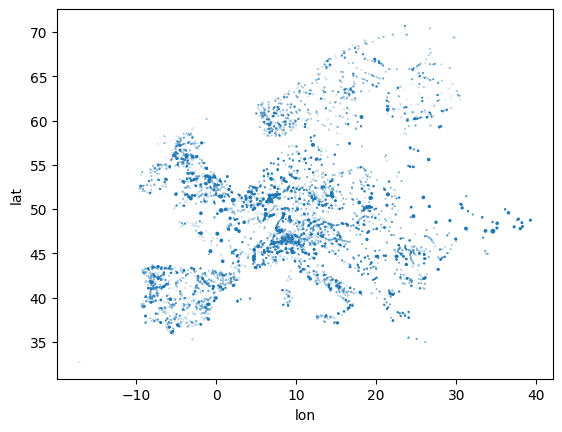

In [5]:
ppl.plot.scatter("lon","lat", s = ppl.Capacity / 1e3)

In [6]:
import geopandas as gpd

In [7]:
geometry = gpd.points_from_xy(ppl["lon"], ppl["lat"]) # converting lon and lat
                                            # geometric points i.e, shapely.Point objects
    


In [8]:
gdf = gpd.GeoDataFrame(ppl, geometry=geometry, crs=4326) # code 4326 is for lon and lat values
gdf.head()

,Name,Fueltype,Technology,Set,Country,Capacity,Efficiency,DateIn,DateRetrofit,DateOut,lat,lon,Duration,Volume_Mm3,DamHeight_m,StorageCapacity_MWh,EIC,projectID,geometry
id,,,,,,,,,,,,,,,,,,,
0,Borssele,Hard Coal,Steam Turbine,PP,Netherlands,485.0,NaN,1973.0,NaN,2034.0,51.4332,3.7160,NaN,0.0,0.0,0.0,{'49W000000000054X'},"{'BEYONDCOAL': {'BEYOND-NL-2'}, 'ENTSOE': {'49...",POINT (3.71600 51.43320)
1,Sainte Croix,Hydro,Reservoir,Store,France,132.3,NaN,1974.0,NaN,NaN,43.7375,6.1343,NaN,0.0,0.0,0.0,{'17W100P100P0297X'},"{'ENTSOE': {'17W100P100P0297X'}, 'GEM': {'G601...",POINT (6.13430 43.73750)
2,Pied De Borne,Hydro,Reservoir,Store,France,109.4,NaN,1965.0,NaN,NaN,44.4788,3.9858,NaN,0.0,0.0,0.0,{'17W100P100P0289W'},"{'ENTSOE': {'17W100P100P0289W'}, 'GEM': {'G601...",POINT (3.98580 44.47880)
3,Pouget,Hydro,Reservoir,Store,France,446.9,NaN,1951.0,NaN,NaN,44.0597,2.7701,1.573034,0.0,0.0,0.0,{'17W100P100P0290A'},"{'ENTSOE': {'17W100P100P0290A'}, 'GEM': {'G601...",POINT (2.77010 44.05970)
4,Pragneres,Hydro,Reservoir,Store,France,189.2,NaN,1953.0,NaN,NaN,42.8205,0.0102,NaN,0.0,0.0,0.0,{'17W100P100P02918'},"{'ENTSOE': {'17W100P100P02918'}, 'GEM': {'G601...",POINT (0.01020 42.82050)


<Axes: >

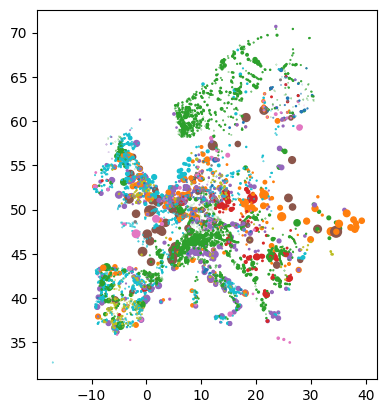

In [9]:
gdf.plot(
    column = "Fueltype",
    markersize = gdf.Capacity / 1e2,)


In [10]:
gdf.explore(column = "Fueltype")

# Cartopy

In [1]:
# Cartopy is a Python package designed for geospatial data processing and has
# exposed an interface to enable easy map creation using matplotlib
# there are several types of projections, earth is a sphere object but for our
# visualizations we project 3D data into 2D flat surface which loses information
# it is up to us to choose the kind of projection we want to use


In [12]:
import warnings
import cartopy
import cartopy.crs as ccrs # crs is coordinate reference system

warnings.filterwarnings("ignore")


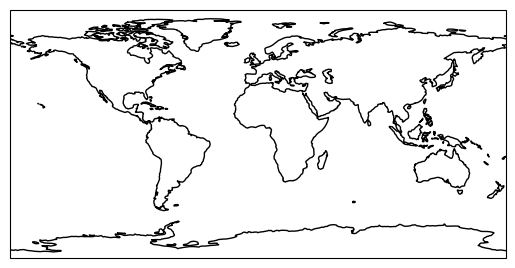

In [13]:
# drawing first map with cartopy outlining the global coastlines in equirectangular projection
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()

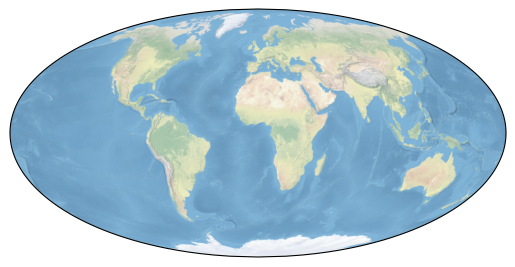

In [14]:
ax = plt.axes(projection=ccrs.Mollweide())
ax.stock_img()

<GeoAxes: >

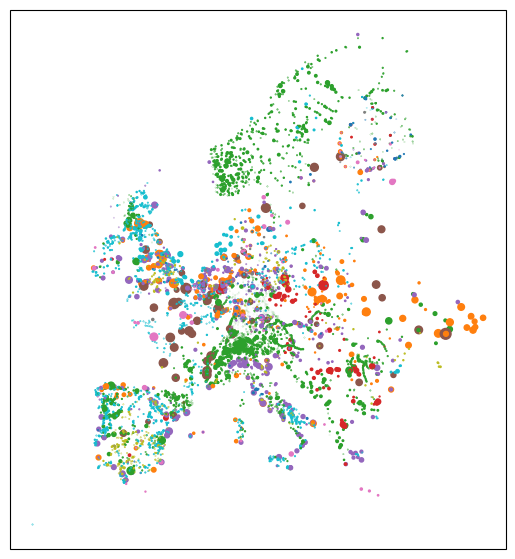

In [15]:
# combinig funtionality of cartopy with geopandas plots
fig = plt.figure(figsize=(7,7))

ax = plt.axes(projection = ccrs.PlateCarree())

gdf.plot(
    ax = ax,
    column = "Fueltype",
    markersize = gdf.Capacity / 1e2,
)

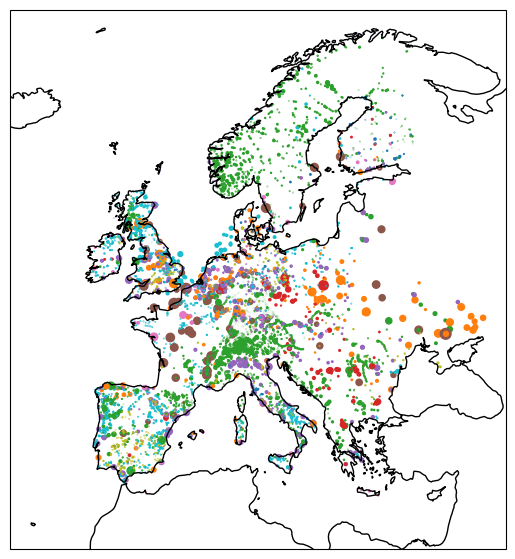

In [16]:
# adding further geographic features
ax.coastlines()
fig

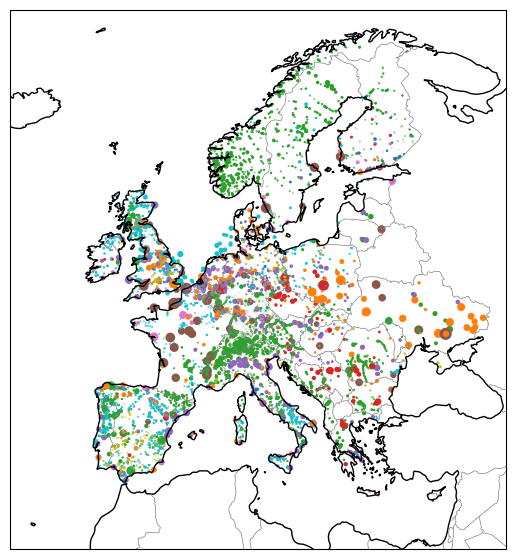

In [17]:
ax.add_feature(cartopy.feature.BORDERS, color="grey", linewidth=0.5)
fig


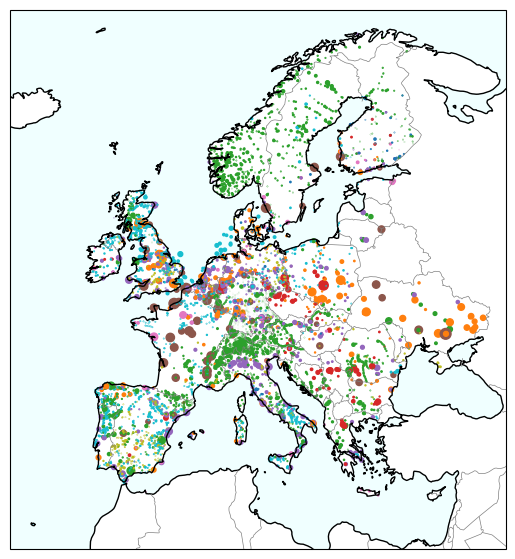

In [18]:
ax.add_feature(cartopy.feature.OCEAN, color="azure")
fig

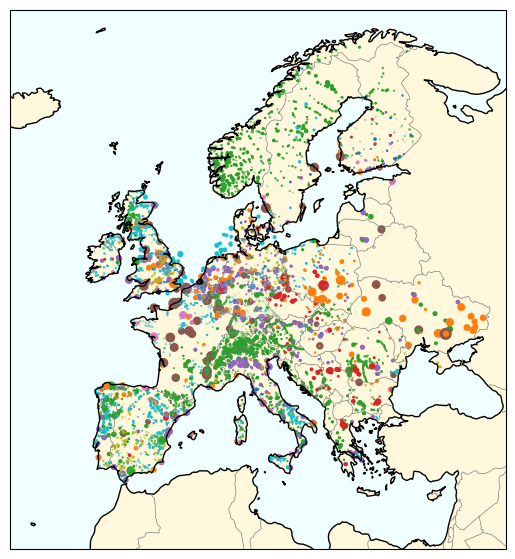

In [19]:
ax.add_feature(cartopy.feature.LAND, color="cornsilk")
fig

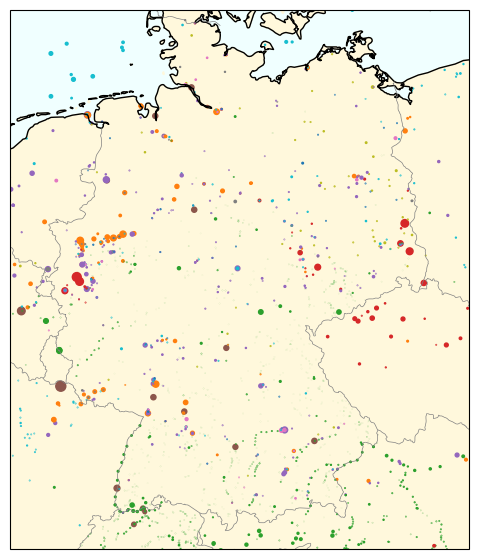

In [20]:
# manual zoom into the maps
ax.set_extent([5, 16, 47, 55])
fig

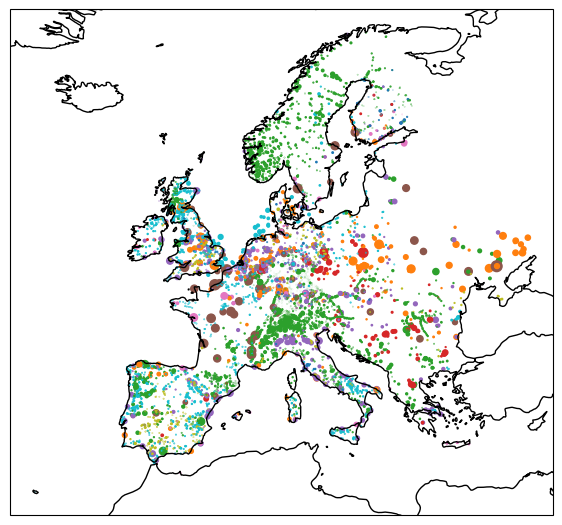

In [21]:
# Reprojecting a GeoDataFrame
# we can use .to_crs() to convert GeoDataFrame to a desired coordinate system

fig = plt.figure(figsize=(7,7))
crs = ccrs.AlbersEqualArea()
ax = plt.axes(projection=crs)

gdf.to_crs(crs.proj4_init).plot(
    ax = ax,
    column = "Fueltype",
    markersize = gdf.Capacity  /1e2,
)
ax.coastlines()

In [22]:
# loading datasets containing NUTS regions
# NUTS = Nomenclature of Territorial Units for Statistics


In [23]:
url = "https://tubcloud.tu-berlin.de/s/RHZJrN8Dnfn26nr/download/NUTS_RG_10M_2021_4326.geojson"

In [24]:
nuts =gpd.read_file(url)

In [25]:
nuts.head()

,id,NUTS_ID,LEVL_CODE,CNTR_CODE,NAME_LATN,NUTS_NAME,MOUNT_TYPE,URBN_TYPE,COAST_TYPE,FID,geometry
0,BG423,BG423,3,BG,Pazardzhik,Пазарджик,3.0,2,3,BG423,"POLYGON ((24.42101 42.55306, 24.41032 42.46950..."
1,BG424,BG424,3,BG,Smolyan,Смолян,3.0,3,3,BG424,"POLYGON ((25.07422 41.79348, 25.05851 41.75177..."
2,BG425,BG425,3,BG,Kardzhali,Кърджали,3.0,3,3,BG425,"POLYGON ((25.94863 41.32034, 25.90644 41.30757..."
3,CH011,CH011,3,CH,Vaud,Vaud,3.0,2,3,CH011,"MULTIPOLYGON (((6.86623 46.90929, 6.89621 46.9..."
4,CH012,CH012,3,CH,Valais,Valais,3.0,2,3,CH012,"POLYGON ((8.47767 46.52760, 8.39953 46.48872, ..."


In [26]:
nuts = nuts.set_index("id")
nuts.head()

,NUTS_ID,LEVL_CODE,CNTR_CODE,NAME_LATN,NUTS_NAME,MOUNT_TYPE,URBN_TYPE,COAST_TYPE,FID,geometry
id,,,,,,,,,,
BG423,BG423,3,BG,Pazardzhik,Пазарджик,3.0,2,3,BG423,"POLYGON ((24.42101 42.55306, 24.41032 42.46950..."
BG424,BG424,3,BG,Smolyan,Смолян,3.0,3,3,BG424,"POLYGON ((25.07422 41.79348, 25.05851 41.75177..."
BG425,BG425,3,BG,Kardzhali,Кърджали,3.0,3,3,BG425,"POLYGON ((25.94863 41.32034, 25.90644 41.30757..."
CH011,CH011,3,CH,Vaud,Vaud,3.0,2,3,CH011,"MULTIPOLYGON (((6.86623 46.90929, 6.89621 46.9..."
CH012,CH012,3,CH,Valais,Valais,3.0,2,3,CH012,"POLYGON ((8.47767 46.52760, 8.39953 46.48872, ..."


In [27]:
nuts.geometry

id
BG423    POLYGON ((24.42101 42.55306, 24.41032 42.46950...
BG424    POLYGON ((25.07422 41.79348, 25.05851 41.75177...
BG425    POLYGON ((25.94863 41.32034, 25.90644 41.30757...
CH011    MULTIPOLYGON (((6.86623 46.90929, 6.89621 46.9...
CH012    POLYGON ((8.47767 46.52760, 8.39953 46.48872, ...
                               ...                        
LV       POLYGON ((27.35158 57.51824, 27.54521 57.53444...
ME       POLYGON ((20.06394 43.00682, 20.32958 42.91149...
MK       POLYGON ((22.36021 42.31116, 22.51041 42.15516...
SK0      POLYGON ((19.88393 49.20418, 19.96275 49.23031...
IT       MULTIPOLYGON (((12.47792 46.67984, 12.69064 46...
Name: geometry, Length: 2010, dtype: geometry

In [28]:
# check which coordinate reference systyem data is given
nuts.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [29]:
nuts.total_bounds

array([-63.08825, -21.38917,  55.83616,  80.76427])

In [30]:
nuts1 = nuts.query("LEVL_CODE == 1")

In [31]:
nuts1.explore()

In [32]:
nuts.to_file("tmp.geojson")

In [33]:
# Calculating Areas and Buffers
# To calcuate area or buffers we need to reproject the GeoDataFrame to an equal
# area projection

nuts1 = nuts1.to_crs(3035)
nuts1.head()

,NUTS_ID,LEVL_CODE,CNTR_CODE,NAME_LATN,NUTS_NAME,MOUNT_TYPE,URBN_TYPE,COAST_TYPE,FID,geometry
id,,,,,,,,,,
AT1,AT1,1,AT,Ostösterreich,Ostösterreich,0.0,0,0,AT1,"POLYGON ((4726983.652 2881333.529, 4742889.099..."
AT2,AT2,1,AT,Südösterreich,Südösterreich,0.0,0,0,AT2,"POLYGON ((4760796.665 2734594.009, 4776670.251..."
EL4,EL4,1,EL,"Nisia Aigaiou, Kriti","Νησιά Αιγαίου, Κρήτη",0.0,0,0,EL4,"MULTIPOLYGON (((6080754.149 1679214.957, 60794..."
EE0,EE0,1,EE,Eesti,Eesti,0.0,0,0,EE0,"MULTIPOLYGON (((5209290.523 4151085.770, 52109..."
EL3,EL3,1,EL,Attiki,Αττική,0.0,0,0,EL3,"MULTIPOLYGON (((5532122.114 1750830.438, 55270..."


In [34]:
area = nuts1.area / 1e6

In [35]:
area

id
AT1    23545.286205
AT2    25894.953057
EL4    17388.679384
EE0    45315.713593
EL3     3799.676547
           ...     
PL7    29846.398582
PL8    63217.536546
PL9    35563.812826
RO2    72545.290405
SK0    49008.115415
Length: 125, dtype: float64

In [36]:
nuts1.explore(column=area, vmax = 1e5)

In [37]:
# Joining Spatial Datasets
# multiple geospatial dataframes / GeoDataFrame can be combined via spatial joins
gdf.head()

,Name,Fueltype,Technology,Set,Country,Capacity,Efficiency,DateIn,DateRetrofit,DateOut,lat,lon,Duration,Volume_Mm3,DamHeight_m,StorageCapacity_MWh,EIC,projectID,geometry
id,,,,,,,,,,,,,,,,,,,
0,Borssele,Hard Coal,Steam Turbine,PP,Netherlands,485.0,NaN,1973.0,NaN,2034.0,51.4332,3.7160,NaN,0.0,0.0,0.0,{'49W000000000054X'},"{'BEYONDCOAL': {'BEYOND-NL-2'}, 'ENTSOE': {'49...",POINT (3.71600 51.43320)
1,Sainte Croix,Hydro,Reservoir,Store,France,132.3,NaN,1974.0,NaN,NaN,43.7375,6.1343,NaN,0.0,0.0,0.0,{'17W100P100P0297X'},"{'ENTSOE': {'17W100P100P0297X'}, 'GEM': {'G601...",POINT (6.13430 43.73750)
2,Pied De Borne,Hydro,Reservoir,Store,France,109.4,NaN,1965.0,NaN,NaN,44.4788,3.9858,NaN,0.0,0.0,0.0,{'17W100P100P0289W'},"{'ENTSOE': {'17W100P100P0289W'}, 'GEM': {'G601...",POINT (3.98580 44.47880)
3,Pouget,Hydro,Reservoir,Store,France,446.9,NaN,1951.0,NaN,NaN,44.0597,2.7701,1.573034,0.0,0.0,0.0,{'17W100P100P0290A'},"{'ENTSOE': {'17W100P100P0290A'}, 'GEM': {'G601...",POINT (2.77010 44.05970)
4,Pragneres,Hydro,Reservoir,Store,France,189.2,NaN,1953.0,NaN,NaN,42.8205,0.0102,NaN,0.0,0.0,0.0,{'17W100P100P02918'},"{'ENTSOE': {'17W100P100P02918'}, 'GEM': {'G601...",POINT (0.01020 42.82050)


In [38]:
gdf = gdf.to_crs(3035)

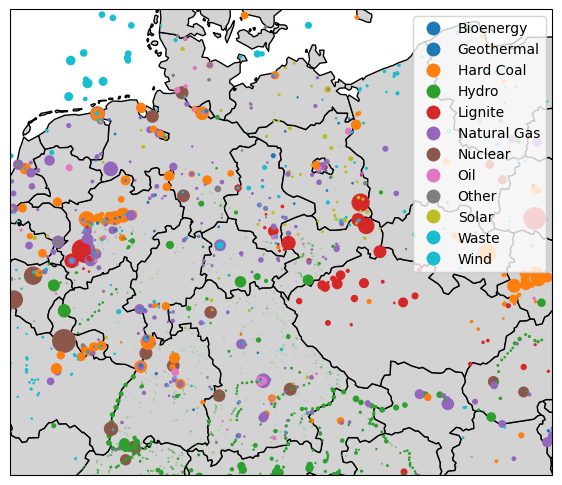

In [39]:
fig = plt.figure(figsize = (7,7))
ax = plt.axes(projection = ccrs.epsg(3035))
nuts1.plot(ax = ax, edgecolor = "black", facecolor = "lightgrey")

gdf.to_crs(3035).plot(
    ax = ax,
    column = "Fueltype",
    markersize = gdf.Capacity / 20, legend = True
)
ax.set_extent([5, 19, 47, 55])

In [40]:
joined = gdf.sjoin(nuts1)

In [41]:
joined.head(3)

,Name,Fueltype,Technology,Set,Country,Capacity,Efficiency,DateIn,DateRetrofit,DateOut,...,index_right,NUTS_ID,LEVL_CODE,CNTR_CODE,NAME_LATN,NUTS_NAME,MOUNT_TYPE,URBN_TYPE,COAST_TYPE,FID
id,,,,,,,,,,,,,,,,,,,,,
1,Sainte Croix,Hydro,Reservoir,Store,France,132.3,NaN,1974.0,NaN,NaN,...,FRL,FRL,1,FR,Provence-Alpes-Côte d’Azur,Provence-Alpes-Côte d’Azur,0.0,0,0,FRL
2,Pied De Borne,Hydro,Reservoir,Store,France,109.4,NaN,1965.0,NaN,NaN,...,FRJ,FRJ,1,FR,Occitanie,Occitanie,0.0,0,0,FRJ
3,Pouget,Hydro,Reservoir,Store,France,446.9,NaN,1951.0,NaN,NaN,...,FRJ,FRJ,1,FR,Occitanie,Occitanie,0.0,0,0,FRJ


In [42]:
cap = joined.groupby("NUTS_ID").Capacity.sum() / 1000 #GW

In [43]:
nuts1.index.difference(cap.index) # check if all NUTS1 region have power plants

Index(['CY0', 'ES7', 'FI2', 'FRY', 'IS0', 'LI0', 'MK0', 'MT0', 'PT2', 'TR1',
       'TR2', 'TR3', 'TR4', 'TR5', 'TR6', 'TR7', 'TR8', 'TR9', 'TRA', 'TRB',
       'TRC'],
      dtype='object')

In [44]:
cap.head(3)

NUTS_ID
AL0    1.743354
AT1    4.463100
AT2    4.896500
Name: Capacity, dtype: float64

In [45]:
cap = cap.reindex(nuts1.index)

In [46]:
cap

id
AT1    4.463100
AT2    4.896500
EL4    0.427967
EE0    2.155000
EL3    1.343142
         ...   
PL7    7.077524
PL8    1.805551
PL9    6.033288
RO2    3.514566
SK0    5.713420
Name: Capacity, Length: 125, dtype: float64

<Axes: >

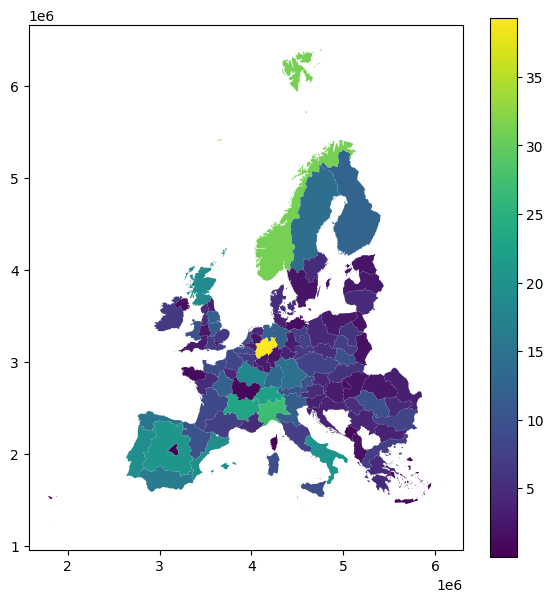

In [47]:
nuts1.plot(figsize=(7,7), column = cap, legend = True)

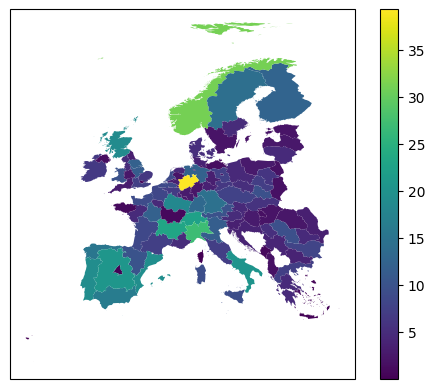

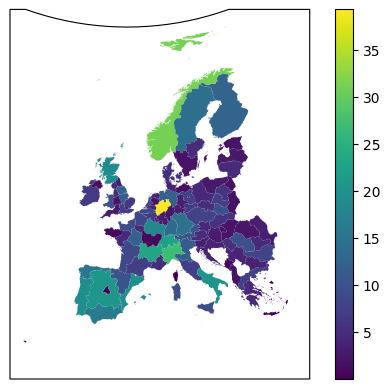

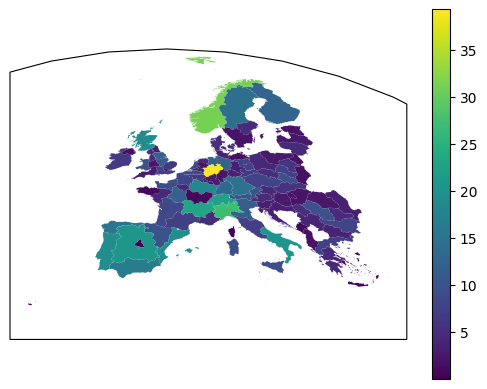

In [48]:
for crs in [ccrs.EqualEarth(), ccrs.AlbersEqualArea(), ccrs.Orthographic()]:
    fig = plt.figure()
    ax = plt.axes(projection = crs)
    nuts1.to_crs(crs.proj4_init).plot(ax = ax, column = cap, legend = True)

<Axes: >

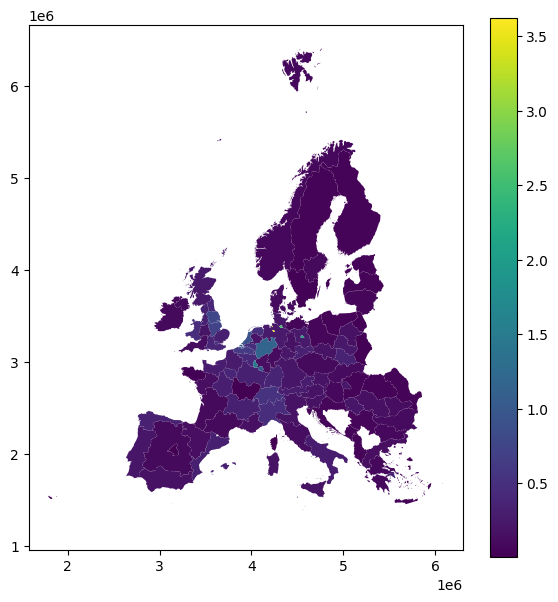

In [49]:
nuts1.plot(figsize = (7,7), column = cap / (nuts1.area / 1e9), legend = True)

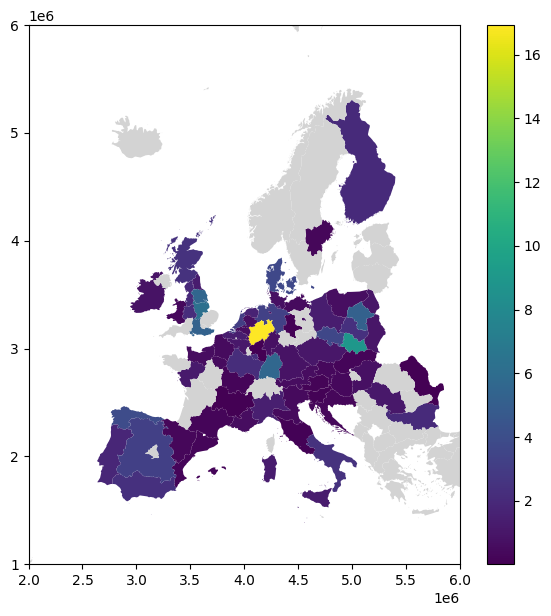

In [50]:
hard_coal_cap = (
    joined.query("Fueltype == 'Hard Coal'")
    .groupby("NUTS_ID")
    .Capacity.sum()
    .reindex(nuts1.index)
    .div(1e3)
)
nuts1.plot(
    figsize=(7,7),
    column= hard_coal_cap,
    legend=True,
    missing_kwds=dict(color="lightgrey"),
)
plt.ylim(1e6, 6e6)
plt.xlim(2e6, 6e6);
    

<Axes: >

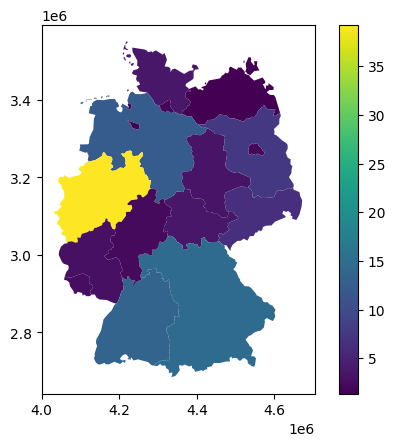

In [51]:
subregion = nuts1.query("CNTR_CODE == 'DE'")
subregion.plot(column=cap.reindex(subregion.index), legend=True)

<Axes: >

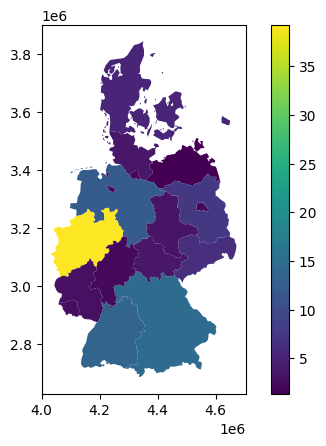

In [52]:
countries = ["DE", "DK"]
subregion = nuts1.query("CNTR_CODE in @countries")
subregion.plot(column=cap.reindex(subregion.index), legend=True)

<Axes: >

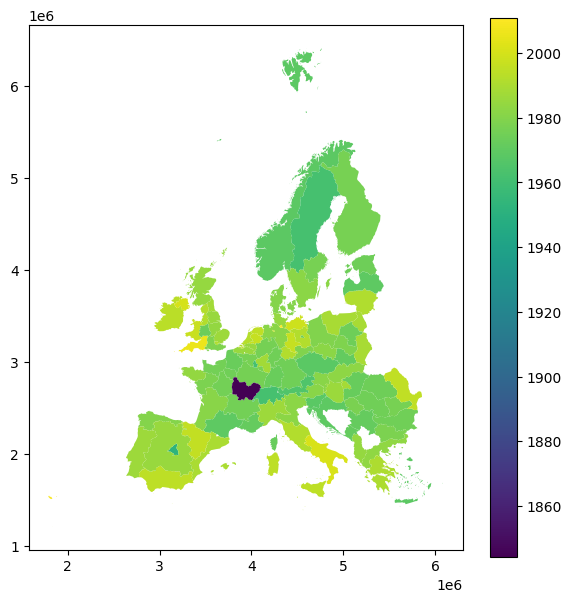

In [58]:
def calculate_weighted_age(x):
    
    """
    Formula:
    \bar{x} = \frac{ \sum\limits_{i=1}^n w_i x_i}{\sum\limits_{i=1}^n w_i}
    """

    numerator = (x.Capacity * x.DateIn).sum()

    # only build sum of capacities where a date is given
    denominator = x.Capacity.where(~x.DateIn.isna()).sum()

    return numerator / denominator


age = joined.groupby("NUTS_ID").apply(calculate_weighted_age).reindex(nuts1.index)

nuts1.plot(figsize=(7, 7), column=age, legend=True)